<a href="https://colab.research.google.com/github/MahaThafar/ImageAugmentation/blob/main/ClassicalImageAugmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Image Augmentation Tutorial using several libraries..**

## **First: Classical Image Augmentation**

#Data Augmentation

# A. Albumentations Library


> Augmentor is a Python package that aims to be both a data augmentation tool and a library of basic image pre-processing functions.







In [ ]:
!pip install -q -U albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.6/290.6 kB 3.9 MB/s eta 0:00:00


In [ ]:
#import required libraries..

import cv2
import albumentations as A
import matplotlib.pyplot as plt


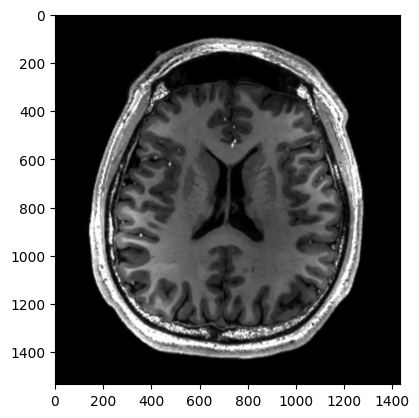

In [ ]:
# Load an image
image = cv2.imread("sample_data/MRI_of_Human_Brain.jpg")
plt.imshow(image)
plt.show()

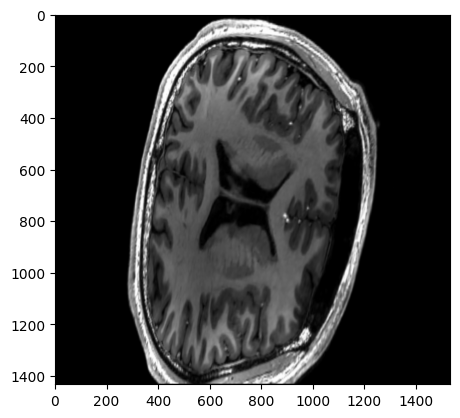

In [ ]:

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

transform = A.Compose(
    [A.CLAHE(),
     A.RandomRotate90(),
     A.Transpose(),
     A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.50,
                        rotate_limit=45, p=.75),
     A.Blur(blur_limit=3),
     A.OpticalDistortion(),
     A.GridDistortion(),
     A.HueSaturationValue()])

augmented_image = transform(image=image)['image']

plt.imshow(augmented_image)
plt.show()


<ipython-input-27-208305406091>:15: UserWarning: Argument(s) 'max_holes, max_height, max_width' are not valid for transform CoarseDropout
  "Coarse Dropout (Cutout Alternative)": A.CoarseDropout(max_holes=10, max_height=30, max_width=30, p=1),


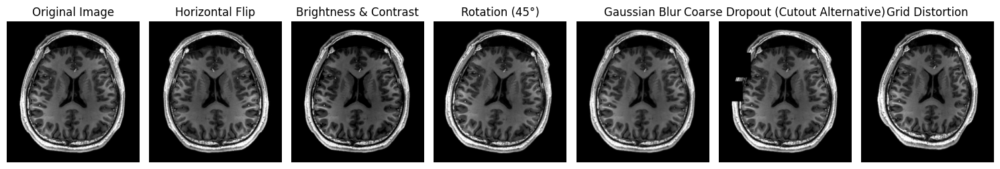

In [ ]:
import cv2
import albumentations as A
import matplotlib.pyplot as plt

# Load an image
image = cv2.imread("sample_data/MRI_of_Human_Brain.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define multiple augmentation pipelines
augmentations = {
    "Horizontal Flip": A.HorizontalFlip(p=1),
    "Brightness & Contrast": A.RandomBrightnessContrast(p=1),
    "Rotation (45°)": A.Rotate(limit=45, p=1),
    "Gaussian Blur": A.GaussianBlur(blur_limit=8, p=1),
    "Coarse Dropout (Cutout Alternative)": A.CoarseDropout(max_holes=10, max_height=30, max_width=30, p=1),
    "Grid Distortion": A.GridDistortion(p=1)
}

# Apply each augmentation and display results
fig, axes = plt.subplots(1, len(augmentations) + 1, figsize=(15, 5))

# Show original image
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")

# Apply each transformation and display
for idx, (name, aug) in enumerate(augmentations.items()):
    augmented = aug(image=image)["image"]
    axes[idx + 1].imshow(augmented)
    axes[idx + 1].set_title(name)
    axes[idx + 1].axis("off")

plt.tight_layout()
plt.show()


# B. imageio Library

In [ ]:
import imageio
import imgaug as ia
import imgaug.augmenters as iaa
import ipyplot


        WARNING! Google Colab Environment detected!
        You might encounter issues while running in Google Colab environment.
        If images are not displaying properly please try setting `force_b64` param to `True`.
        


In [ ]:
! pip install ipyplot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 11.6 MB/s eta 0:00:00


In [ ]:
input_img = imageio.imread('sample_data/sample2.jpg')

<ipython-input-38-a3d93da9d705>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  input_img = imageio.imread('sample_data/sample2.jpg')



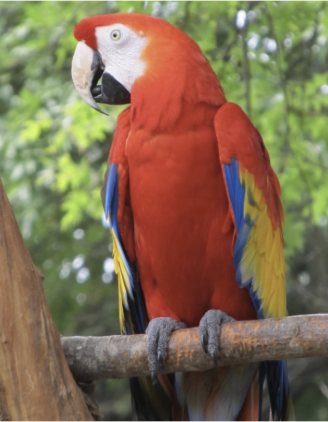
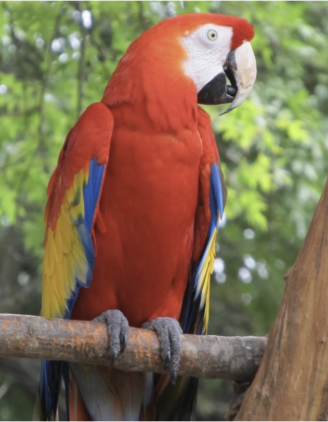
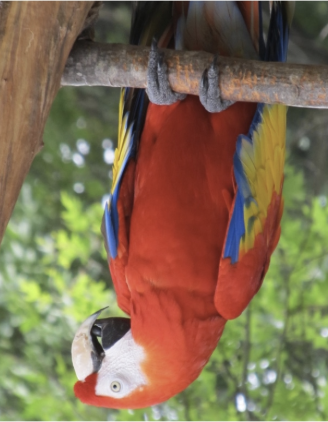


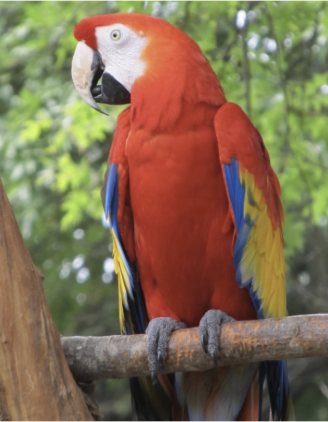
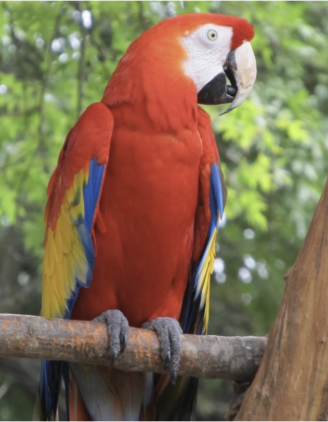
...
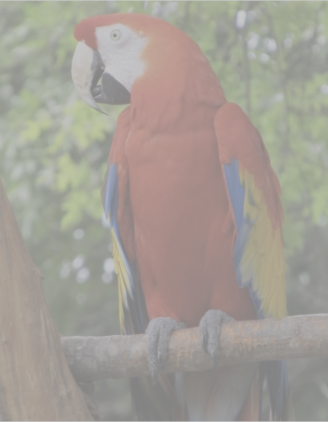


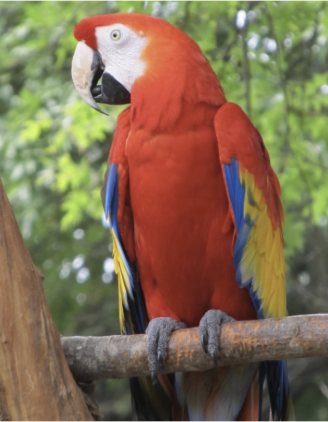
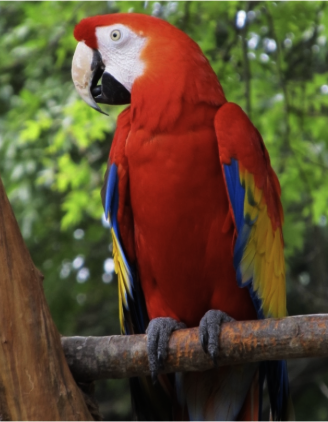
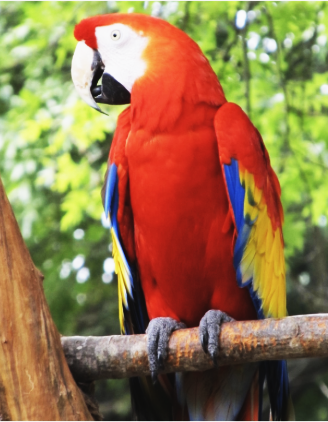
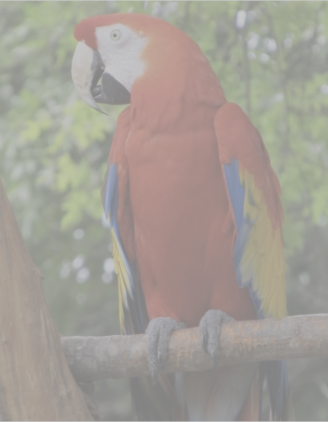

In [ ]:
#Horizontal Flip
hflip= iaa.Fliplr(p=1.0)
input_hf= hflip.augment_image(input_img)
#Vertical Flip
vflip= iaa.Flipud(p=1.0)
input_vf= vflip.augment_image(input_img)
images_list=[input_img, input_hf, input_vf]
labels = ['Original', 'Horizontally flipped', 'Vertically flipped']
ipyplot.plot_images(images_list,labels=labels,img_width=180)

# Image Rotation
rot1 = iaa.Affine(rotate=(-50,20))
input_rot1 = rot1.augment_image(input_img)
images_list=[input_img, input_rot1]
labels = ['Original', 'Rotated Image']
ipyplot.plot_images(images_list,labels=labels,img_width=180)

# Image crop
crop1 = iaa.Crop(percent=(0, 0.3))
input_crop1 = crop1.augment_image(input_img)
images_list=[input_img, input_crop1]
labels = ['Original', 'Cropped Image']
ipyplot.plot_images(images_list,labels=labels,img_width=180)

# Adding Noise
noise=iaa.AdditiveGaussianNoise(10,40)
input_noise=noise.augment_image(input_img)
images_list=[input_img, input_noise]
labels = ['Original', 'Gaussian Noise Image']
ipyplot.plot_images(images_list,labels=labels,img_width=180)

#Image Shearing
shear = iaa.Affine(shear=(-40,40))
input_shear=shear.augment_image(input_img)
images_list=[input_img, input_shear]
labels = ['Original', 'Image Shearing']
ipyplot.plot_images(images_list,labels=labels,img_width=180)


#Image contrast
contrast=iaa.GammaContrast((0.5, 2.0))
contrast_sig = iaa.SigmoidContrast(gain=(5, 10), cutoff=(0.4, 0.6))
contrast_lin = iaa.LinearContrast((0.6, 0.4))
input_contrast = contrast.augment_image(input_img)
sigmoid_contrast = contrast_sig.augment_image(input_img)
linear_contrast = contrast_lin.augment_image(input_img)
images_list=[input_img, input_contrast,sigmoid_contrast,linear_contrast]
labels = ['Original', 'Gamma Contrast','SigmoidContrast','LinearContrast']
ipyplot.plot_images(images_list,labels=labels,img_width=180)




# C.Keras Library with tensorflow backend
### Data augmentation in TensorFlow and Keras

To augment images when using TensorFlow or Keras as our DL framework, we can:
*   Write our own augmentation pipelines or layers using tf.image.
*   Use Keras preprocessing layers
*   Use ImageDataGenerator




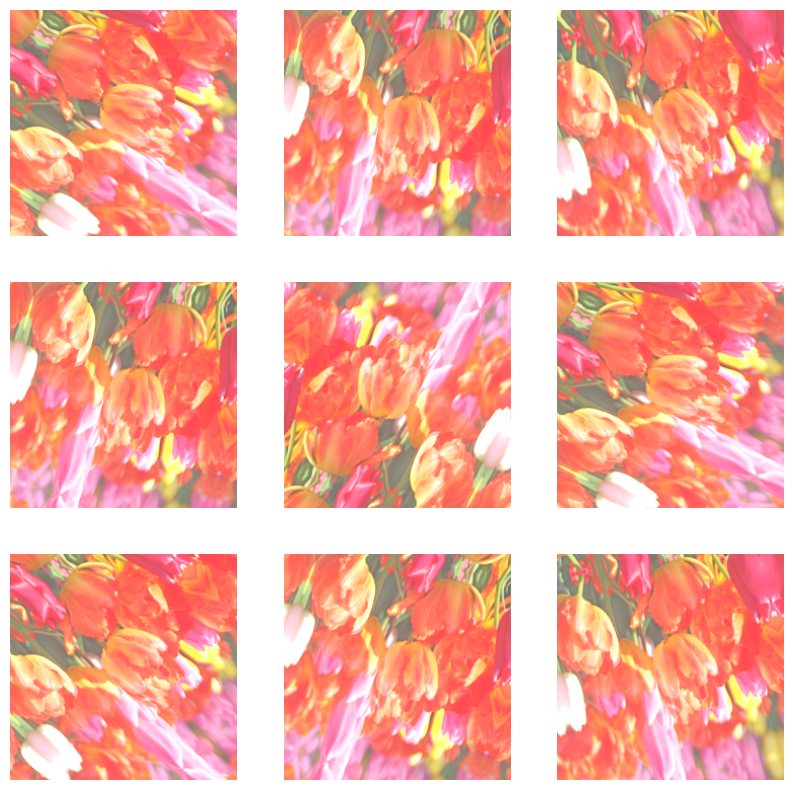

In [ ]:
import tensorflow_datasets as tfds
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import layers


# Define AUTOTUNE for optimization
AUTOTUNE = tf.data.experimental.AUTOTUNE

#---------------------------------------------------
# Augmentation function for dataset
def augment(image, label):
    image = tf.cast(image, tf.float32)
    image = tf.image.resize(image, [256, 256])
    image = image / 255.0  # Normalize
    image = tf.image.random_crop(image, size=[224, 224, 3])  # Crop
    image = tf.image.random_brightness(image, max_delta=0.5)  # Brightness
    return image, label

#----------------------------------------------------
# Load dataset
(train_ds, val_ds, test_ds), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True
)

# Apply augmentation to training dataset
train_ds = (train_ds
            .shuffle(1000)
            .map(augment, num_parallel_calls=AUTOTUNE)
            .batch(32)
            .prefetch(AUTOTUNE))

# Define Data Augmentation Layer
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2)
])

# Pick one sample image from dataset for augmentation visualization
for image, label in train_ds.take(1):
    sample_image = image[0]  # Get one image

# Expand dimensions for batch processing
image_batch = tf.expand_dims(sample_image, 0)

# Visualize augmented images
plt.figure(figsize=(10, 10))
for i in range(9):
    augmented_image = data_augmentation(image_batch)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_image[0].numpy())  # Convert tensor to NumPy
    plt.axis("off")
plt.show()


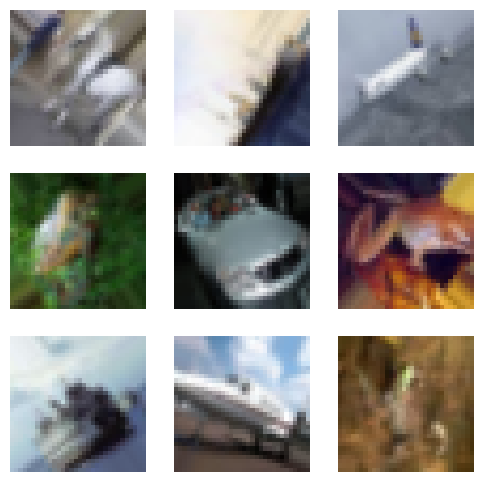

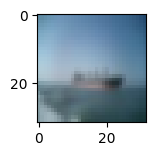

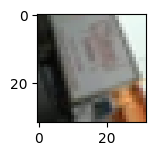

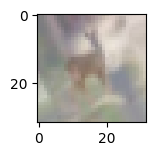

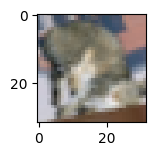

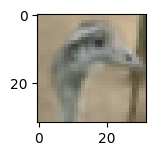

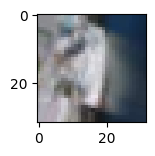

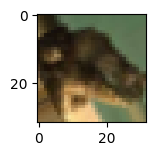

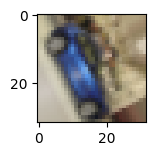

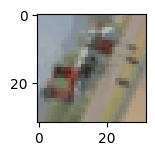

In [ ]:


import ipyplot
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Dummy Data for x_train and y_train (Replace with actual dataset)
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

# Normalize pixel values (Optional but recommended)
x_train = x_train.astype("float32") / 255.0

# Define Data Augmentation
datagen = ImageDataGenerator(rotation_range=90)

# Fit Data Generator
datagen.fit(x_train)

# Plot augmented images
plt.figure(figsize=(6,6))
for X_batch, y_batch in datagen.flow(x_train, y_train, batch_size=9, seed=42):
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(X_batch[i])  # No need to reshape for RGB images
        plt.axis("off")
    plt.show()
    break  # Stop after one batch


datagen = ImageDataGenerator(rotation_range=90)
datagen.fit(x_train)
for X_batch, y_batch in datagen.flow(x_train, y_train, batch_size=9):
    for i in range(0, 9):
        plt.subplot(330 + 1 + i)
        plt.imshow(X_batch[i]) #.reshape(:, :, 3))
        plt.show()
    break